In [1]:
import numpy as np
import torch
import torch.nn.functional as F

from RnaVeloDataset import RnaVeloDataset
from symsimDataset import SymsimBifur, SymsimTree, SymsimBranch, SymsimLinear, SymsimCycle

from torch_geometric.data import DataLoader, Data
from model.BaseModel import BaseModel
from sklearn.metrics import mean_squared_error
from model.mymodel import MyModel, GraphSAGEModel, FCModel, veloModel, DiffusionModel
from math import sqrt
import utils
import backbone

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

In [2]:
dataBifur = SymsimBifur()
dataTree = SymsimTree()
# dataBranch = SymsimBranch()
# datalinear = SymsimLinear()
# dataCircle = SymsimCycle()
# dataDyngen = RnaVeloDataset()
print(len(dataBifur))
print(len(dataTree))

finished(0:00:00)-->added
    'root_cells', root cells of Markov diffusion process (adata.obs)
    'end_points', end points of Markov diffusion process (adata.obs)
Normalized count data:spliced, unspliced.
Skip filtering by dispersion since number of variables are less than `n_top_genes`
300
computing neighbors
    finished(0:00:00)-->added to `.uns['neighbors']`
    'distances', weighted adjacency matrix
    'connectivities', weighted adjacency matrix
computing moments based on connectivities
    finished(0:00:00)-->added 
    'Ms' and 'Mu', moments of spliced/unspliced abundances (adata.layers)
computing velocities
    finished(0:00:00)-->added 
    'velocity', velocity vectors for each individual cell (adata.layers)
computing velocity graph
... 100%    finished(0:00:00)-->added 
    'velocity_graph', sparse matrix with cosine correlations (adata.uns)
computing terminal states
    identified1 regionof root cells and1 regionof end points
    finished(0:00:00)-->added
    'root_cells',

In [3]:
def train(model, train_loader, lamb = None, train_loss = 'pearson'):
    model.train()

    total_loss = 0
    for data in train_loader:
        data = data.to(device)
        optimizer.zero_grad()
        """
        Note that here I change the output of the model to incorporate the adj matrix (after the sigmoid transform)
        """
        # output = model(data)
        output, node_embed, adj = model(data)

        loss = 0
        if lamb:
            adj = adj.numpy()
            # eliminate self node
            adj = adj - adj[0,0] * np.diag(np.ones(adj.shape[0]))
            train_nodes = np.arange(adj.shape[0])

            unsupervised_loss = unsup_loss.UnsupervisedLoss(adj = adj, train_nodes=train_nodes, device = device)
            nodes_batch = np.asarray(list(unsupervised_loss.extend_nodes(nodes=train_nodes, num_neg=6)))
            loss_net = unsupervised_loss.get_loss_sage(node_embed, nodes_batch)

            loss = lamb * loss_net


        label = data.y.to(device)

        if train_loss == 'pearson':
            # pearson correlation loss
            vx = output - torch.mean(output)
            vy = label - torch.mean(label)
            loss += -torch.sum(vx * vy) / (torch.sqrt(torch.sum(vx ** 2)) * torch.sqrt(torch.sum(vy ** 2)))
        if train_loss == 'rmse':
            loss += torch.sqrt(F.mse_loss(output, label))

        loss.backward()
        total_loss += data.num_graphs * loss.item()
        optimizer.step()

    return float(total_loss / len(train_loader.dataset))

def test(model, loader):
    model.eval()
    
    correct = []
    predict = []
    neg_pearson_loss = 0
    for data in loader:
        data = data.to(device)
        label = data.y.detach().cpu().numpy().reshape(-1)
        
        pred,_,_ = model(data)

        pred = pred.detach().cpu().numpy().reshape(-1)
        
        neg_pearson_loss += utils.pearson(pred, label)

    neg_pearson_loss = - neg_pearson_loss / len(loader)

    return neg_pearson_loss

In [4]:
t = np.arange(1, 10)
bifur_train_mask = []
bifur_val_mask = []
for i in range(12):
    bifur_train_mask += list(t + 10*i)
    bifur_val_mask.append(10*i)

tree_train_mask = []
tree_val_mask = []
for i in range(6):
    tree_train_mask += list(t + 10*i)
    tree_val_mask.append(10*i)

In [5]:
data_train = torch.utils.data.ConcatDataset([dataBifur[bifur_train_mask], dataTree[tree_train_mask]])
data_val = torch.utils.data.ConcatDataset([dataBifur[bifur_val_mask], dataTree[tree_val_mask]])
print("Number of Train:", str(len(data_train)), "\nNumber of Val:", str(len(data_val)))

Number of Train:162
Number of Val:18


# Test Diffusion NN
On tree, linear, bifurcating

In [25]:
# mask the dataset
train_loader = DataLoader(data_train, batch_size = 1, shuffle = True)
val_loader = DataLoader(data_val, batch_size = 1)

model = DiffusionModel(dataBifur.num_features, hidden1 = 256, hidden2 = 128, max_diffusion = 6, include_reversed = True, device = device, dropout1=0.4, dropout2=0.2).to(device)

# reset parameters
model.reset_parameters()
print(model)

optimizer = torch.optim.Adam(params=model.parameters(), lr=1e-5, weight_decay=0.05)

train_list = []
val_list = []
for epoch in range(0, 121):

    train_loss = train(model, train_loader, train_loss='rmse')
    train_acc = test(model, train_loader)
    val_acc = test(model, val_loader)

    log = 'Epoch: {:03d}, Loss: {:.4f}, Train: {:.4f}, Val: {:.4f}'
    if epoch % 10 == 0:
        print(log.format(epoch, train_loss, train_acc, val_acc))
    
    train_list.append(train_acc)
    val_list.append(val_acc)

DiffusionModel(
  (conv1): GraphDiffusion (300 -> 256)
  (conv2): GraphDiffusion (256 -> 128)
  (lin): Linear(in_features=128, out_features=1, bias=True)
)
Epoch: 000, Loss: 0.2123, Train: -0.8447, Val: -0.8415
Epoch: 010, Loss: 0.0714, Train: -0.9671, Val: -0.9370
Epoch: 020, Loss: 0.0585, Train: -0.9766, Val: -0.9487
Epoch: 030, Loss: 0.0538, Train: -0.9794, Val: -0.9520
Epoch: 040, Loss: 0.0518, Train: -0.9809, Val: -0.9572
Epoch: 050, Loss: 0.0511, Train: -0.9810, Val: -0.9562
Epoch: 060, Loss: 0.0495, Train: -0.9821, Val: -0.9595
Epoch: 070, Loss: 0.0494, Train: -0.9824, Val: -0.9603
Epoch: 080, Loss: 0.0492, Train: -0.9825, Val: -0.9603
Epoch: 090, Loss: 0.0485, Train: -0.9828, Val: -0.9596
Epoch: 100, Loss: 0.0481, Train: -0.9831, Val: -0.9614
Epoch: 110, Loss: 0.0481, Train: -0.9830, Val: -0.9603
Epoch: 120, Loss: 0.0480, Train: -0.9829, Val: -0.9613


In [26]:
Path = "./Diffusion_symsim_tree_bifur_noisy.pt"
torch.save(model.state_dict(), Path)

In [27]:
Path = "./Diffusion_symsim_tree_bifur_noisy.pt"

model = DiffusionModel(dataTree.num_features, hidden1 = 256, hidden2 = 128, max_diffusion = 6, include_reversed = True, device = device, dropout1=0.4, dropout2=0.2).to(device)
model.load_state_dict(torch.load(Path, map_location=torch.device('cpu')))
model.eval()

DiffusionModel(
  (conv1): GraphDiffusion (300 -> 256)
  (conv2): GraphDiffusion (256 -> 128)
  (lin): Linear(in_features=128, out_features=1, bias=True)
)

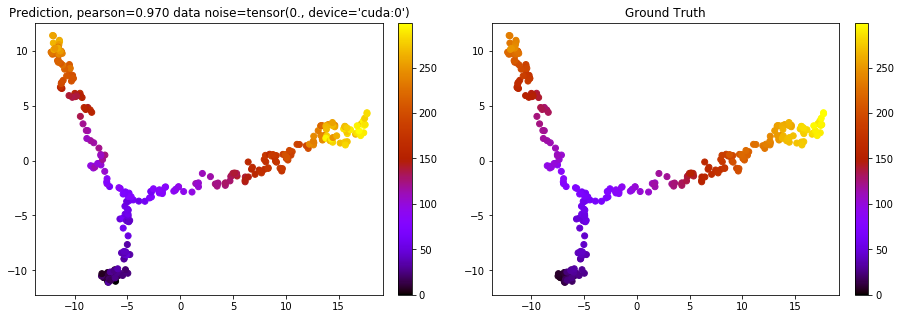

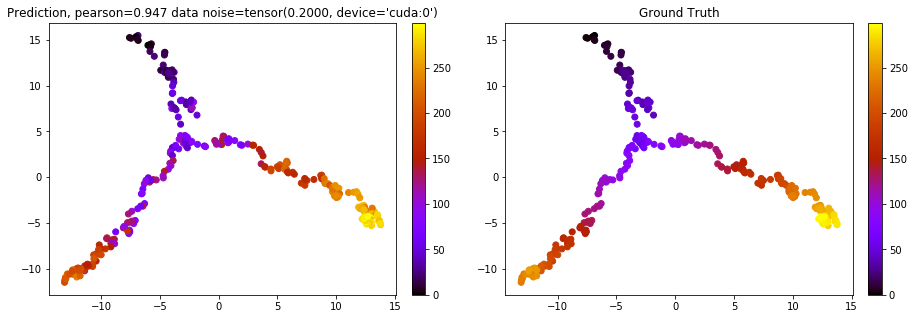

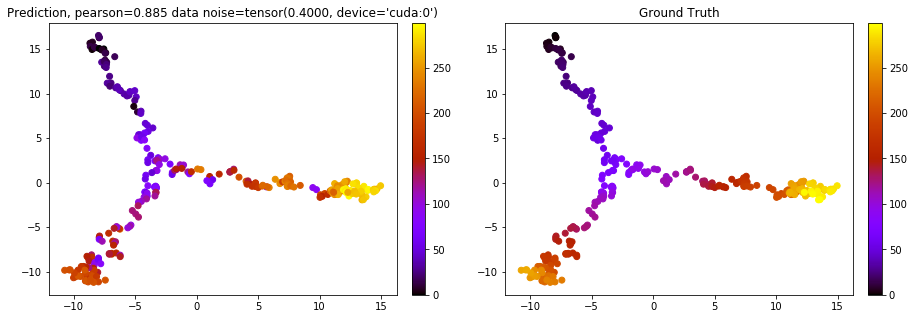

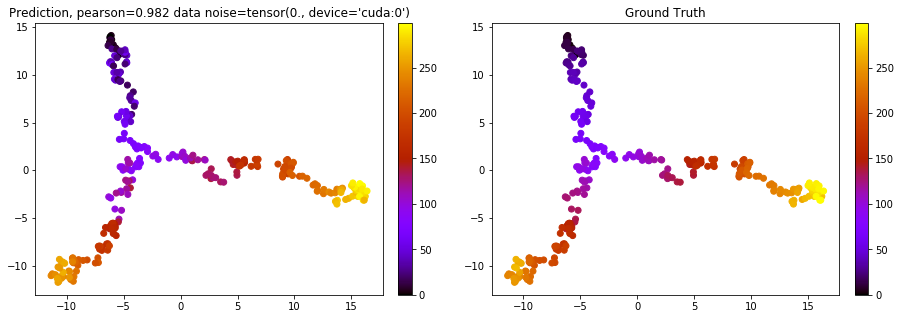

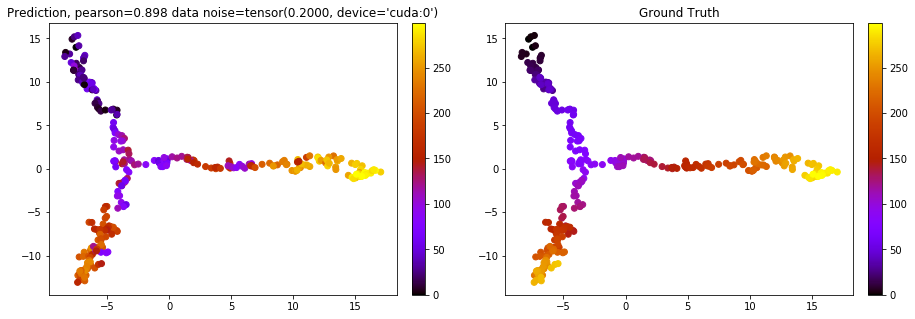

...

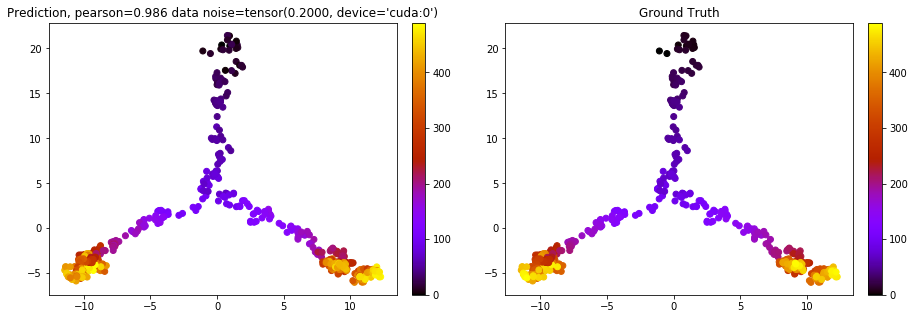

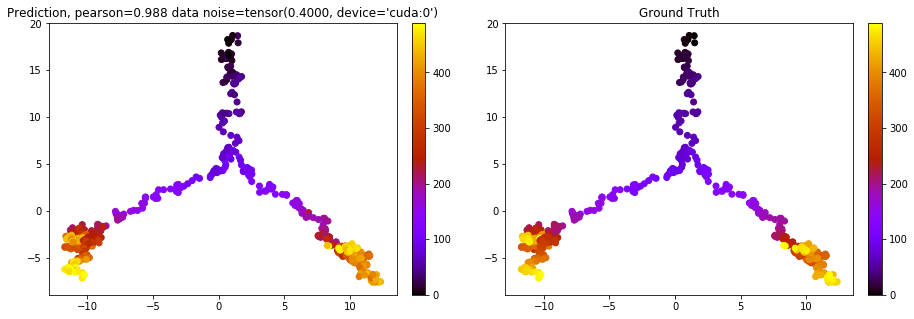

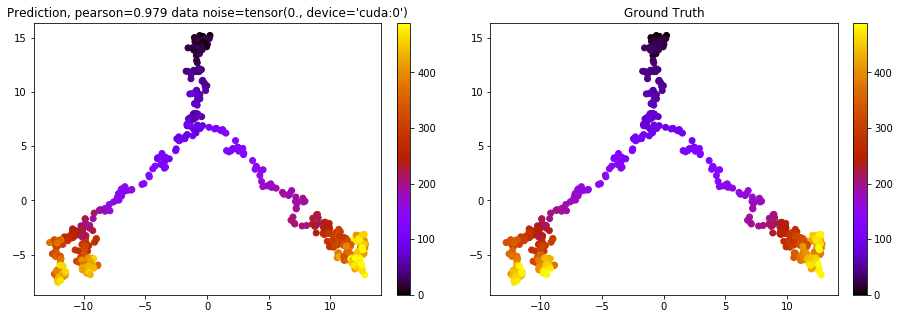

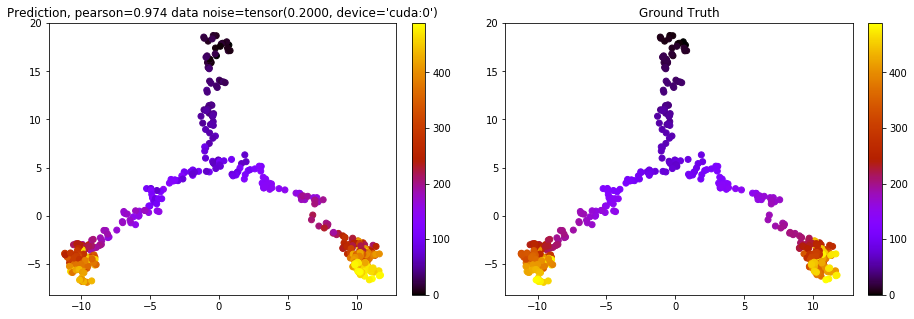

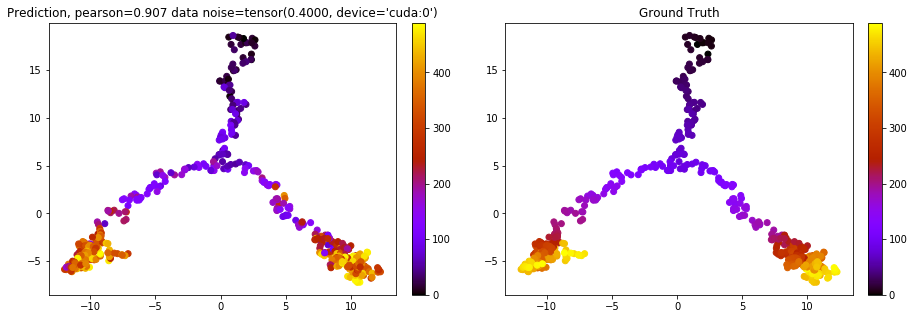

In [28]:
for data in val_loader:
    utils.scatter(model, data, method='pca', coloring='order', metric='pearson', knn=False)

# Test Fully connected NN
On both linear, tree, bifurcating and real dataset, without velocity

**Too test if FC NN can work in linear structure, new dataset is needed, as current branch test is meaningless for FC NN**

In [10]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model_fc = FCModel(dataBifur.num_features, device, hidden1=256, hidden2=128, dropout1=0.4, dropout2=0.2).to(device)

train_loader = DataLoader(data_train, batch_size = 1, shuffle = True)
val_loader = DataLoader(data_val, batch_size = 1)

# reset parameters|
# model_fc.reset_parameters()
print(model_fc)

optimizer = torch.optim.Adam(params=model_fc.parameters(), lr=1e-4, weight_decay=0.01)

train_list = []
val_list = []
for epoch in range(101):

    train_loss = train(model_fc, train_loader, train_loss='rmse')
    train_acc = test(model_fc, train_loader)
    val_acc = test(model_fc, val_loader)
    log = 'Epoch: {:03d}, Loss: {:.4f}, Train: {:.4f}, Val: {:.4f}'
    if epoch % 10 == 0:
        print(log.format(epoch, train_loss, train_acc, val_acc))
    
    train_list.append(train_acc)
    val_list.append(val_acc)

FCModel(
  (lin1): Linear(in_features=300, out_features=256, bias=True)
  (lin2): Linear(in_features=256, out_features=128, bias=True)
  (lin3): Linear(in_features=128, out_features=1, bias=True)
)
Epoch: 000, Loss: 0.2375, Train: -0.8532, Val: -0.8427
Epoch: 010, Loss: 0.0782, Train: -0.9638, Val: -0.9486
Epoch: 020, Loss: 0.0612, Train: -0.9777, Val: -0.9687
Epoch: 030, Loss: 0.0571, Train: -0.9805, Val: -0.9721
Epoch: 040, Loss: 0.0551, Train: -0.9820, Val: -0.9740
Epoch: 050, Loss: 0.0551, Train: -0.9820, Val: -0.9768
Epoch: 060, Loss: 0.0541, Train: -0.9824, Val: -0.9755
Epoch: 070, Loss: 0.0535, Train: -0.9831, Val: -0.9760
Epoch: 080, Loss: 0.0529, Train: -0.9829, Val: -0.9770
Epoch: 090, Loss: 0.0527, Train: -0.9834, Val: -0.9757
Epoch: 100, Loss: 0.0527, Train: -0.9837, Val: -0.9762


In [11]:
Path = "./Linear_symsim_tree_bifur_noisy.pt"
torch.save(model_fc.state_dict(), Path)

In [12]:
Path = "./Linear_symsim_tree_bifur_noisy.pt"

model_fc = FCModel(dataBifur.num_features, device, hidden1=256, hidden2=128, dropout1=0.4, dropout2=0.2).to(device)
model_fc.load_state_dict(torch.load(Path, map_location=torch.device('cpu')))
model_fc.eval()

FCModel(
  (lin1): Linear(in_features=300, out_features=256, bias=True)
  (lin2): Linear(in_features=256, out_features=128, bias=True)
  (lin3): Linear(in_features=128, out_features=1, bias=True)
)

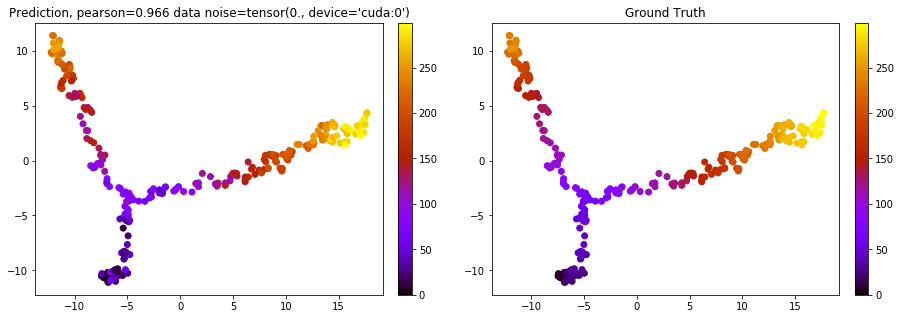

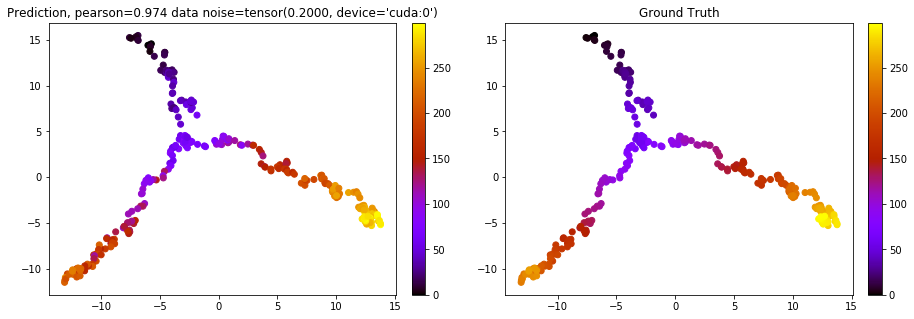

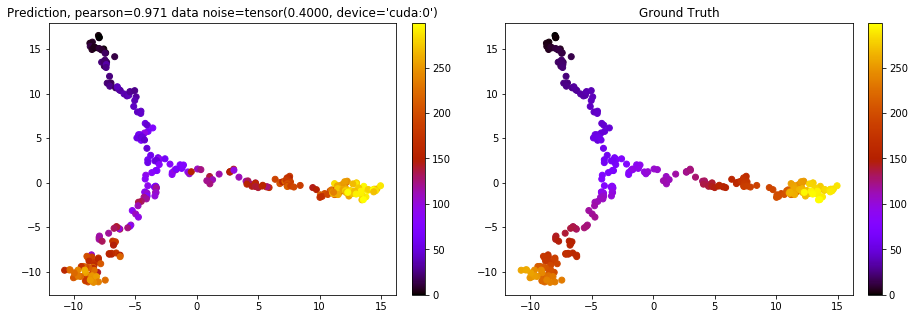

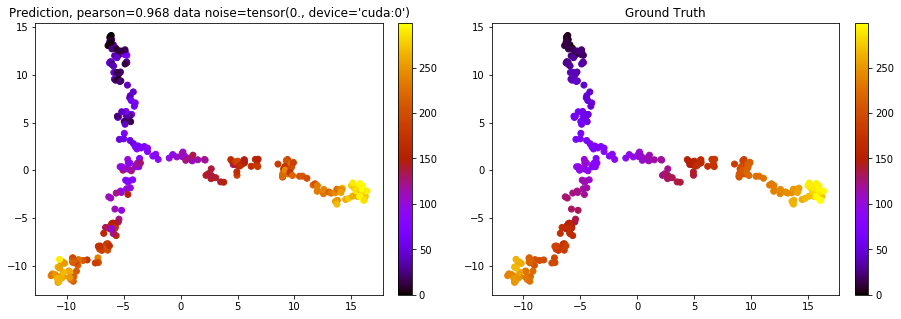

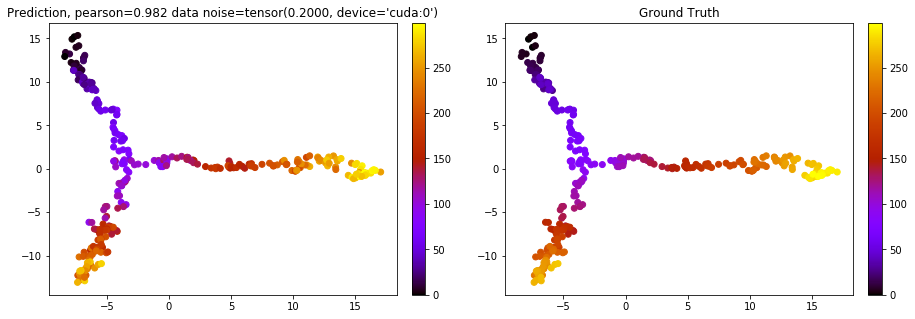

...

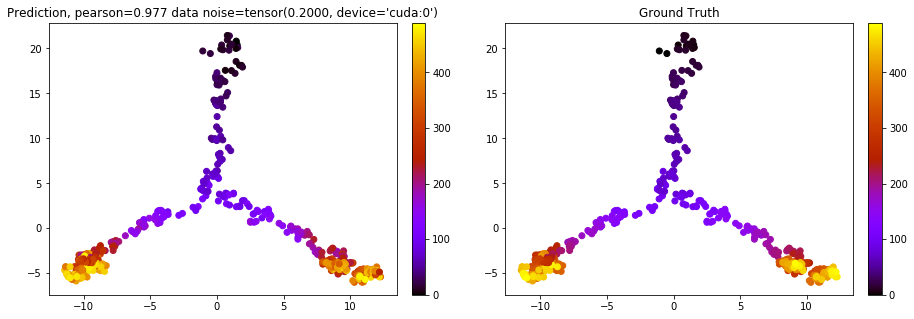

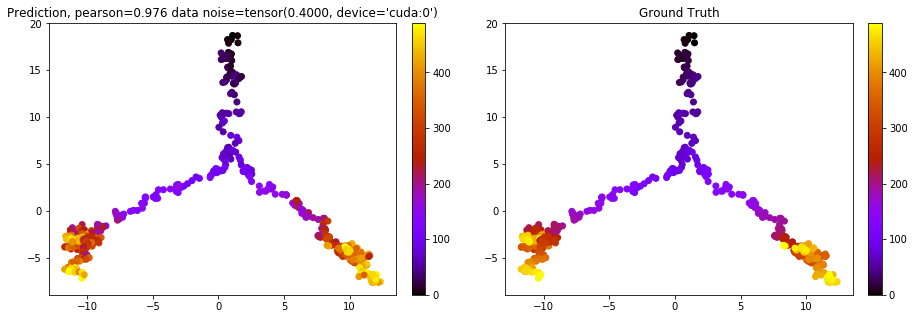

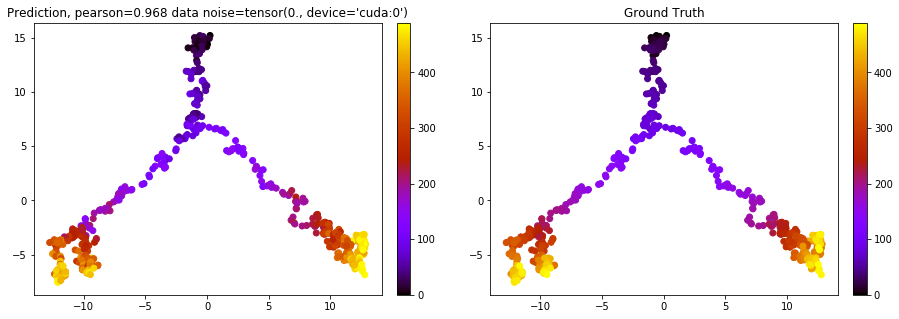

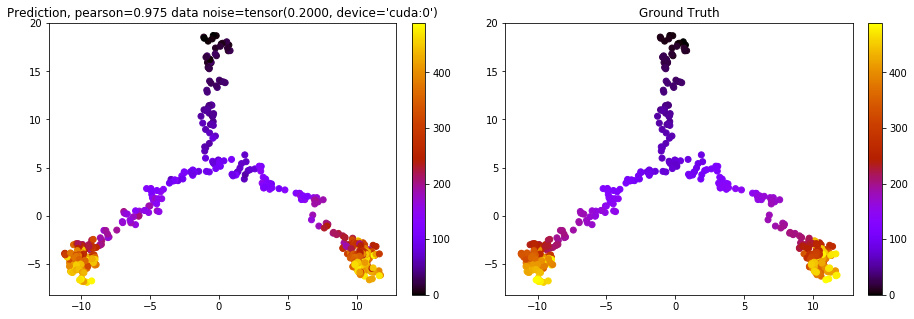

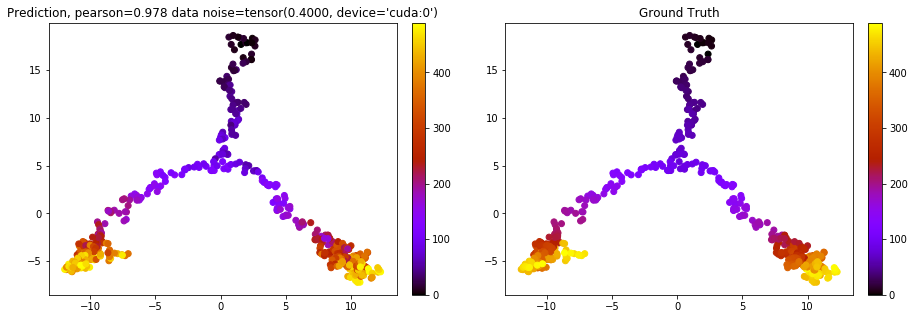

In [23]:
for data in data_val:
    utils.scatter(model_fc, data, method='pca', coloring='order', metric='pearson', knn=False)

In [11]:
import scanpy as sc
real_file = "./data/real_dataset/"
cell_annot = pd.read_csv(real_file + "Paul_cell_meta.txt", sep="\t")
expr = pd.read_csv(real_file + "Paul_expr.txt", sep="\t")
adata = anndata.AnnData(X=expr.T, obs = cell_annot)
sc.pp.filter_genes(adata, min_counts = 20)
sc.pp.normalize_per_cell(adata)
sc.pp.filter_genes_dispersion(adata, n_top_genes= 300)
sc.pp.log1p(adata)
sc.tl.pca(adata)
sc.pp.neighbors(adata, n_neighbors=10)
sc.tl.umap(adata)

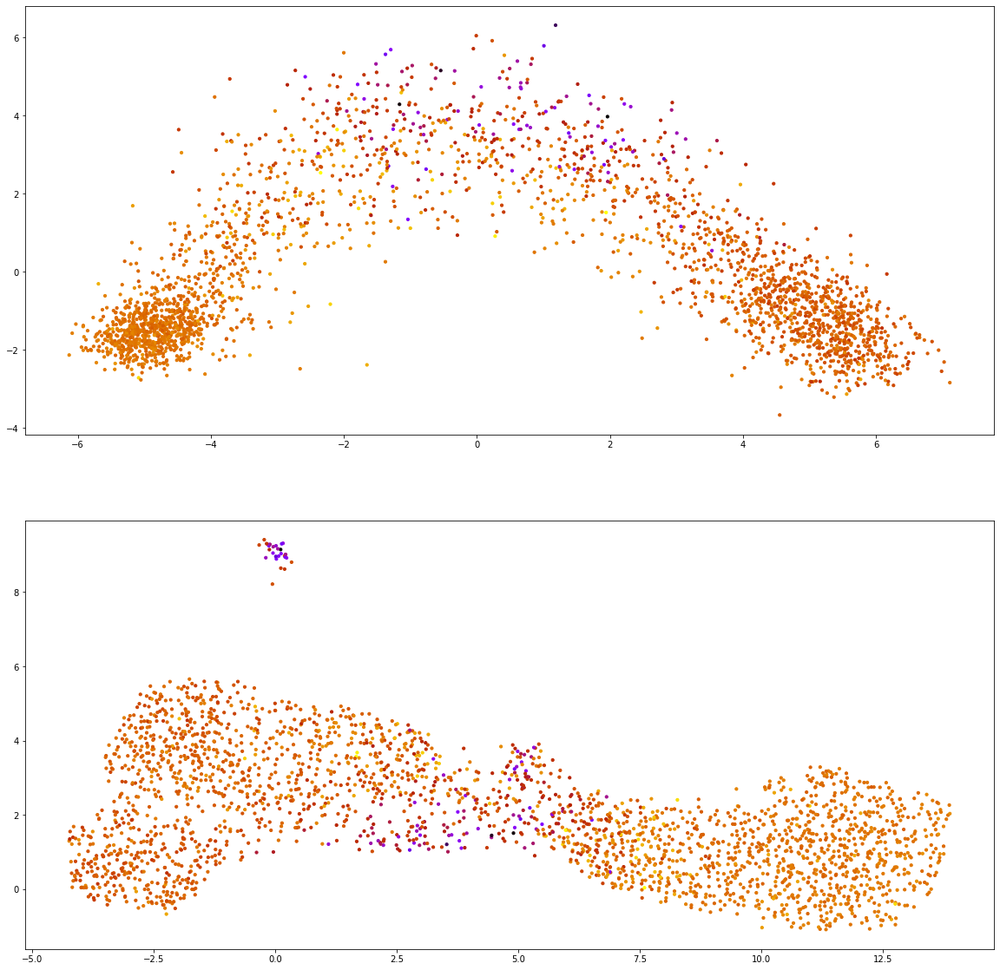

In [14]:
other_index = ~(adata.obs["cell_type2"] == 'Multipotent progenitors').values

X_spliced = adata.X
# X_spliced is original, X_pca is after pca
x = X_spliced.copy()
x = StandardScaler().fit_transform(x)
x = torch.FloatTensor(x)
data = Data(x=x)
# X should be something before pca
X = data.x.numpy()

X_pca = adata.obsm['X_pca']
X_umap = adata.obsm['X_umap']

data = data.to(device)
pred,_,_ = model(data)
pred = pred.detach().cpu().numpy().reshape(-1)


fig, (ax1,ax2) = plt.subplots(2, 1, figsize=(20,20))
ax1.scatter(X_pca[:,0],X_pca[:,1], cmap = 'gnuplot', c = pred, s = 10)
# ax1.scatter(X_pca[other_index,0],X_pca[other_index,1], color = "gray", s = 15)

ax2.scatter(X_umap[:,0], X_umap[:,1], cmap = 'gnuplot', c = pred, s = 10)
# ax2.scatter(X_umap[other_index,0],X_umap[other_index,1], color = "gray", s = 15)

# ax1.scatter(X_pca[:,0],X_pca[:,1], cmap = 'gnuplot', color = adata.obs['cell_type2'].to_numpy())
plt.show()

In [54]:
def slingshot_visual(data, results, trajs = None, show_pcurve = True, figsize = (20,10), save_as = None):
    X = data.x.numpy()
    X_pca = utils.pca_op(X, n_comps = 2, standardize=False)
    label = data.y.numpy().squeeze()

    if trajs == None:
        trajs = results['pseudotime'].shape[1]
    ncols = np.ceil(trajs).astype('int32')
    nrows = 1
    fig, axs = plt.subplots(nrows = nrows, ncols = ncols, figsize = figsize)
    fig.suptitle("slingshot pseudo-time", fontsize = 18)
    for i in range(trajs):
        if nrows == 1 or ncols == 1:
            if nrows == 1 and ncols == 1:
                ax = axs
            else:
                ax = axs[i]
        else:
            ax = axs[i%nrows, i//nrows]
        ax.scatter(X_pca[:,0],X_pca[:,1], color = 'gray', alpha = 0.1)
        if show_pcurve:
            # for curve in results['curves']:
            ax.plot(results['curves'][i,:,0],results['curves'][i,:,1],color = 'black')

        cells = results['pseudotime'].iloc[:,i]
        # eliminate `cell` in the string
        cells_index = [x for x in cells.index if not np.isnan(cells[x])]
        ordering = [x for x in cells[cells_index].sort_values().index]

        pred = [np.nanmean(x) for x in results["pseudotime"].values]

        vx = pred - np.mean(pred)
        vy = label - np.mean(label)
        pearson = np.sum(vx * vy) / (np.sqrt(np.sum(vx ** 2)) * np.sqrt(np.sum(vy ** 2)))

        X_traj = X_pca[ordering,:]

        pseudo_visual = ax.scatter(X_traj[:,0],X_traj[:,1],c = np.arange(X_traj.shape[0]), cmap=plt.get_cmap('gnuplot'),alpha = 0.7)
        fig.colorbar(pseudo_visual,fraction=0.046, pad=0.04, ax = ax)
        ax.set_title("reconstructed trajectory " + str(i))
        fig.suptitle("Pearson correlationship: "+ str(pearson))
    if save_as != None:
        fig.savefig(save_as)
    plt.show()    
    return pearson 

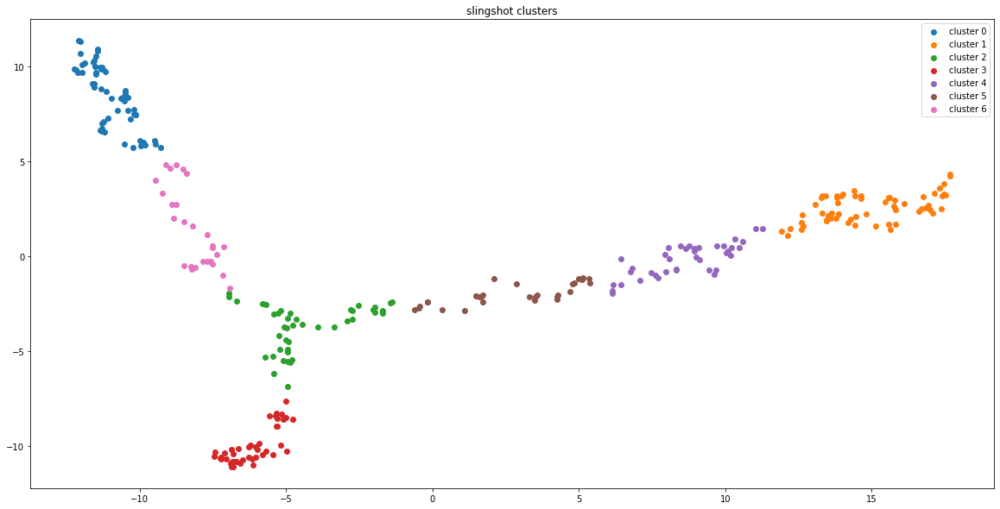

In [57]:
X = data_bifur.x.numpy()
X_pca = utils.pca_op(X, n_comps = 2, standardize=False)
from sklearn.cluster import KMeans
n_clusters = 7
init = "k-means++"
n_init = 10
max_iter = 300
tol = 0.0001
kmeans = KMeans(n_clusters, init, n_init, max_iter, tol)
groups = kmeans.fit_predict(X_pca)

fig = plt.figure(figsize = (20,10))
ax = fig.add_subplot()
# c_range = [eval(x) if isinstance(x, str) else x for x in adata.obs['sim_time']]
clusters = int(np.max(groups)+1)
for i in range(clusters):
    sub_cells = np.where(groups == i)[0]
    progression = ax.scatter(X_pca[sub_cells,0], X_pca[sub_cells,1], cmap = plt.get_cmap('Pastel1'))

ax.legend(['cluster '+ str(i) for i in range(clusters)])
ax.set_title("slingshot clusters")

X_pca_df = pd.DataFrame(columns= np.arange(X_pca.shape[1]), data = X_pca)

R[write to console]: Using full covariance matrix


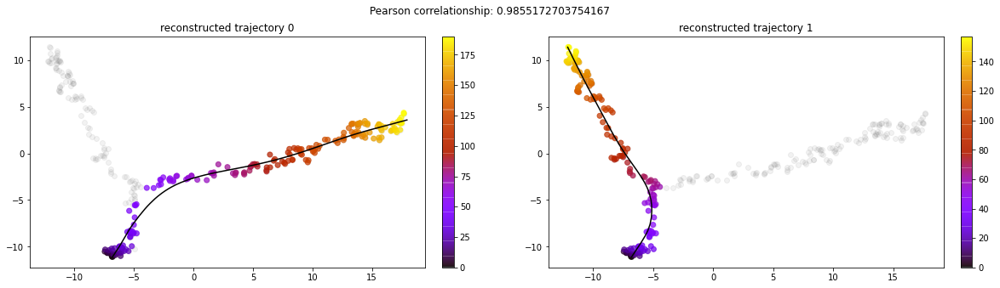

0.9855172703754167

In [60]:
results = scprep.run.Slingshot(X_pca_df, groups, start_cluster = 3)
slingshot_visual(data_bifur, results, trajs = None, show_pcurve = True, figsize = (20,5), save_as = None)

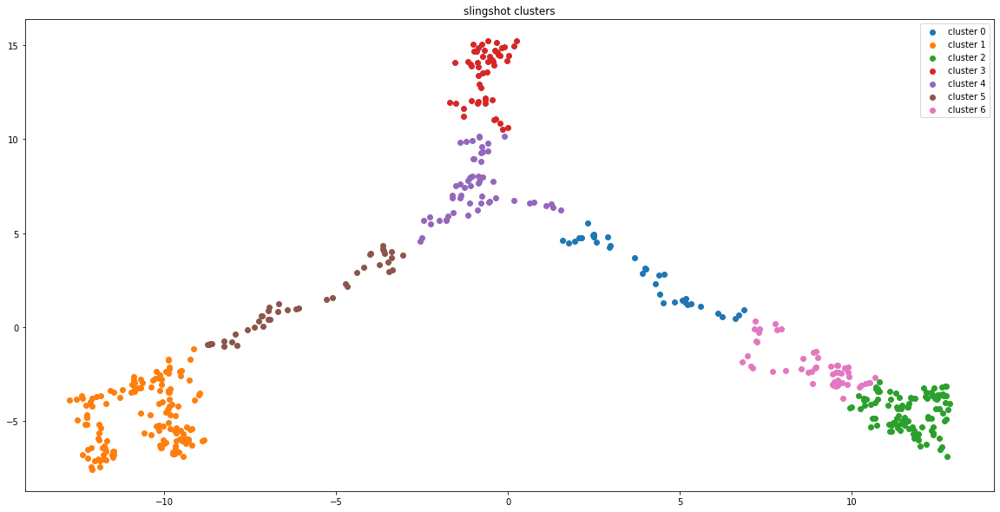

In [61]:
X = data_tree.x.numpy()
X_pca = utils.pca_op(X, n_comps = 2, standardize=False)
from sklearn.cluster import KMeans
n_clusters = 7
init = "k-means++"
n_init = 10
max_iter = 300
tol = 0.0001
kmeans = KMeans(n_clusters, init, n_init, max_iter, tol)
groups = kmeans.fit_predict(X_pca)

fig = plt.figure(figsize = (20,10))
ax = fig.add_subplot()
# c_range = [eval(x) if isinstance(x, str) else x for x in adata.obs['sim_time']]
clusters = int(np.max(groups)+1)
for i in range(clusters):
    sub_cells = np.where(groups == i)[0]
    progression = ax.scatter(X_pca[sub_cells,0], X_pca[sub_cells,1], cmap = plt.get_cmap('Pastel1'))

ax.legend(['cluster '+ str(i) for i in range(clusters)])
ax.set_title("slingshot clusters")

X_pca_df = pd.DataFrame(columns= np.arange(X_pca.shape[1]), data = X_pca)

R[write to console]: Using full covariance matrix


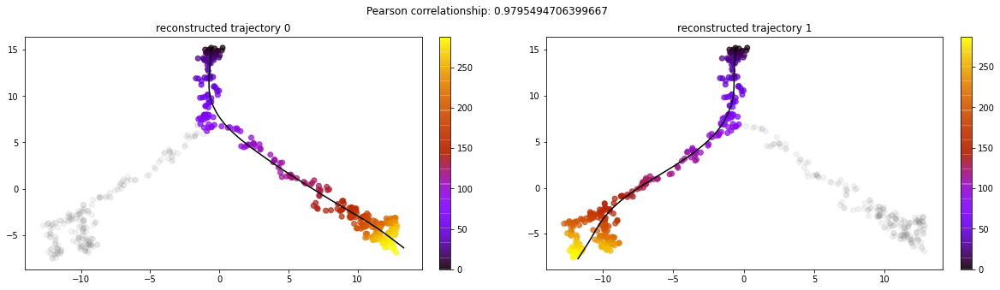

0.9795494706399667

In [64]:
results = scprep.run.Slingshot(X_pca_df, groups, start_cluster = 3)
slingshot_visual(data_tree, results, trajs = None, show_pcurve = True, figsize = (20,5), save_as = None)